# SST-1 Live Analysis - Final!
### This is the final version I intend to be used for the NIST February 16th beamtime. If in need of support, please call me at 989-598-4217. This notebook MUST be used with the live_analysis branch of Github updated 2/14/2023.
-Camille Bishop

### Imports - YOU WILL PROBABLY NEED TO CHANGE THIS. Must work on live_analysis branch of Github code

In [1]:
%reload_ext autoreload
%autoreload 2
import PyHyperScattering as phs
from PyHyperScattering import __version__
print(f'USING PYHYPER VERSION: {__version__}')

/nsls2/users/cbishop/PyHyperScattering/src/PyHyperScattering/integrate.py:3: UserWarning: Could not import CuPy or ndigpu.  If you expect this machine to support CuPy, check dependencies.  Falling back to scikit-image/numpy CPU integration.
  from PyHyperScattering.WPIntegrator import WPIntegrator


USING PYHYPER VERSION: 0.1.10+54.g65fef37


In [2]:
import numpy as np
import pandas as pd
import datetime

import matplotlib.pyplot as plt
import matplotlib as mpl

from matplotlib.colors import LogNorm
from matplotlib.pyplot import cm
from scipy.signal import savgol_filter

In [3]:
!pip install xarray==2022.3
import xarray as xr
from tiled.client import from_profile

### Set up loaders

In [4]:
load_db = phs.load.SST1RSoXSDB(corr_mode='none') # this one uses databroker
c = from_profile('rsoxs')

OBJECT CACHE: Will use up to 121_499_065_344 bytes (15% of total physical RAM)
INFO:tiled.server.object_cache:Will use up to 121_499_065_344 bytes (15% of total physical RAM)
OBJECT CACHE: Will use up to 121_499_065_344 bytes (15% of total physical RAM)
INFO:tiled.server.object_cache:Will use up to 121_499_065_344 bytes (15% of total physical RAM)


In [5]:
from importlib import reload
reload(phs)

<module 'PyHyperScattering' from '/nsls2/users/cbishop/PyHyperScattering/src/PyHyperScattering/__init__.py'>

### Picking Scans
In general, you should have some idea of what you're looking for. Check docs in SST1RSoXSDB.py if you're having trouble with arguments - they are: summarize_run(self, outputType:str = 'default', cycle:str = None, proposal:str =None, saf:str = None, user:str = None, institution:str = None, project:str = None, sample:str = None, sampleID:str = None,  plan:str = None, userOutputs: list = [], **kwargs) -> pd.DataFrame:.

I have set up cell to take in the 3 most relevant parameters (IMO), if you need to get more specific, use those above. If you do not want to specify one, just hit "enter" without putting anything in.

Examples:

In [6]:
# Choose a spiral
sample_name = str(input("Enter sample name (do not use quotation marks) = ")) # don't use quotation marks when entering these
cycle = str(input("Enter cycle (do not use quotation marks) = "))
plan_name = str(input("Enter plan name (no quotation marks) ="))
load_db.summarize_run(cycle=cycle,sampleID=sample_name,plan=plan_name)

Enter sample name (do not use quotation marks) =  JM_2
Enter cycle (do not use quotation marks) =  2022-3
Enter plan name (no quotation marks) = spiralsearch


Searching by keyword arguments:   0%|          | 0/9 [00:00<?, ?it/s]

Building output dataframe:   0%|          | 0/1 [00:00<?, ?it/s]

,scan_id,start time,cycle,institution,project,sample_name,sample_id,plan,detector,polarization,exit_status,num_Images
0,48746,1.674174e+09,2022-3,NIST,comissioning,JM_2,JM_2,spiralsearch,saxs_det,N/A,success,49


In [7]:
# pick an old scan to ensure backwards compatibility
sample_name = str(input("Enter sample name (do not use quotation marks) = ")) # don't use quotation marks when entering these
cycle = str(input("Enter cycle (do not use quotation marks) = "))
plan_name = str(input("Enter plan name (no quotation marks) ="))
load_db.summarize_run(cycle=cycle,sampleID=sample_name,plan=plan_name)

Enter sample name (do not use quotation marks) =  CB_MG_280K
Enter cycle (do not use quotation marks) =  2021-3
Enter plan name (no quotation marks) = 


Searching by keyword arguments:   0%|          | 0/9 [00:00<?, ?it/s]

Building output dataframe:   0%|          | 0/23 [00:00<?, ?it/s]

,scan_id,start time,cycle,institution,project,sample_name,sample_id,plan,detector,polarization,exit_status,num_Images
0,32790,1.636038e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,spiralsearch,WAXS,N/A,success,49
1,32820,1.636049e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,spiralsearch,WAXS,N/A,success,49
2,32821,1.636049e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,spiralsearch,WAXS,N/A,success,49
3,32829,1.636053e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,spiralsearch,WAXS,N/A,success,121
4,32830,1.636054e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,spiralsearch,WAXS,N/A,success,68
5,32834,1.636055e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,count,WAXS,N/A,success,1
6,32835,1.636055e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,count,WAXS,N/A,success,1
7,32836,1.636055e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,scan,WAXS,N/A,success,120
8,32837,1.636055e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,count,WAXS,N/A,success,1
9,32838,1.636056e+09,2021-3,NIST,RSoXS,CB_MG_280K,CB_MG_280K,count,WAXS,N/A,success,1


In [8]:
# pick a SAXS scan
sample_name = str(input("Enter sample name (do not use quotation marks) = ")) # don't use quotation marks when entering these
cycle = str(input("Enter cycle (do not use quotation marks) = "))
plan_name = str(input("Enter plan name ="))
load_db.summarize_run(cycle=cycle,sampleID=sample_name,plan=plan_name)

Enter sample name (do not use quotation marks) =  JM_3
Enter cycle (do not use quotation marks) =  2022-3
Enter plan name = rsoxs


Searching by keyword arguments:   0%|          | 0/9 [00:00<?, ?it/s]

Building output dataframe:   0%|          | 0/8 [00:00<?, ?it/s]

,scan_id,start time,cycle,institution,project,sample_name,sample_id,plan,detector,polarization,exit_status,num_Images
0,48792,1.674333e+09,2022-3,NIST,comissioning,JM_3,JM_3,rsoxs_c,waxs_det,N/A,success,112
1,48793,1.674333e+09,2022-3,NIST,comissioning,JM_3,JM_3,rsoxs_o,waxs_det,N/A,success,114
2,48803,1.674337e+09,2022-3,NIST,comissioning,JM_3,JM_3,rsoxs_c,waxs_det,N/A,success,112
3,48804,1.674338e+09,2022-3,NIST,comissioning,JM_3,JM_3,rsoxs_o,waxs_det,N/A,success,114
4,48810,1.674341e+09,2022-3,NIST,comissioning,JM_3,JM_3,rsoxs_c,saxs_det,N/A,success,112
5,48811,1.674342e+09,2022-3,NIST,comissioning,JM_3,JM_3,rsoxs_o,saxs_det,N/A,success,114
6,48820,1.674346e+09,2022-3,NIST,comissioning,JM_3,JM_3,rsoxs_c,saxs_det,N/A,success,112
7,48821,1.674346e+09,2022-3,NIST,comissioning,JM_3,JM_3,rsoxs_o,saxs_det,N/A,success,114


... And so forth. Use this to pick out the scan numbers for what you want to look at.

# Using spirals to pick a spot

In [9]:
import ipywidgets as ipw
import hvplot.xarray # noqa
import hvplot.pandas # noqa
import panel as pn
import pandas as pd
import panel.widgets as pnw
import hvplot

In [10]:
loaded_spiral = load_db.loadRun(c[48746]) # picked from above summarize_run

Below, adjust slider to find desired spiral:


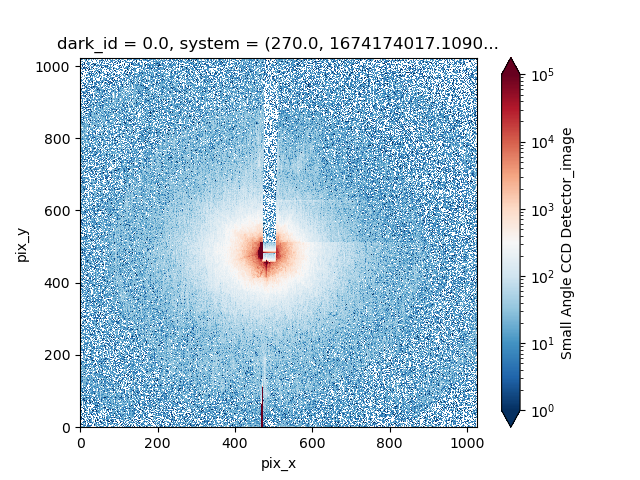

In [11]:
slider = pnw.IntSlider(name='position', start=0, end=48)
loaded_spiral.interactive(width=800).isel(system=slider).plot(norm=LogNorm(1,1e5))

In [12]:
# Find x,y that corresponds to desired spiral position
spot_pos = int(input("Position number from above = "))
sample_xy = (loaded_spiral['sam_x'].values[spot_pos],loaded_spiral['sam_y'].values[spot_pos])
print(f'Position for spreadsheet is x,y = {sample_xy}')

Position number from above =  27


Position for spreadsheet is x,y = (8.1, -145.3)


# Prepare integrator and masks for high-throughput integration
I have prepared some default masks. These were taken from the SAXS/WAXS during commissioning, and include only the beamstop. These should be sufficient for quick analysis, but would of course be susceptible to hotspots on the detector. To make new masks, use "Updated_DrawMask.ipynb" in tutorial folder.

In [21]:
loadedWAXS = load_db.loadRun(c[48803]) # loading a run for WAXS; this integrator should work for all WAXS with the same mask (if you use separate masks for each sample, you will need to construct new integrators each time)
loadedSAXS = load_db.loadRun(c[48746]) # picked a spiral, just for masking

One drawback for right now is that you do need to specify "sel" down to unique positions

In [22]:
imgWAXS = loadedWAXS.isel(system=7) # chooses single images to test mask/beam center
imgSAXS = loadedSAXS.isel(system=24)

WAXSpath = 'WAXSBstop_commissioning.json' # masks created in ./PyHyperScattering/tutorials/Updated_DrawMask from December 2022 commissioning
SAXSpath = 'SAXSBstop_commissioning.json' # may want to update masks with the beginning of the run you're currently using for high-throughput
# when you're doing later data analysis, you'll want to have different masks for different scans, in case of streaks

WAXSinteg = phs.integrate.PFEnergySeriesIntegrator(geomethod='template_xr',template_xr =loadedWAXS) # make integrators
SAXSinteg = phs.integrate.PFEnergySeriesIntegrator(geomethod='template_xr',template_xr =loadedSAXS)

drawWAXS = phs.IntegrationUtils.DrawMask(imgWAXS)
drawSAXS = phs.IntegrationUtils.DrawMask(imgSAXS)

#it's normal to get the mask error, since we're about to add it back

/nsls2/users/cbishop/PyHyperScattering/src/PyHyperScattering/PFGeneralIntegrator.py:323: UserWarning: Since mask was none, creating an empty mask with shape (1024, 1026)
  self.calibrationFromTemplateXRParams(template_xr)


In [23]:
%%capture
drawWAXS.load(WAXSpath)
drawSAXS.load(SAXSpath)

### Check that everything lines up. Re-run this cell to update beam centers
Adjust beam center (a property of your integrator object). To check visually, can adjust img min/max, as well as diameters of the guide circles (d_inner and d_outer)

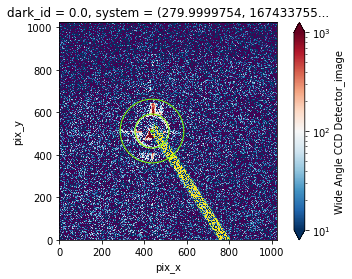

In [24]:
WAXSinteg.mask = drawWAXS.mask

WAXSinteg.ni_beamcenter_x =435.84
WAXSinteg.ni_beamcenter_y = 512.18

phs.IntegrationUtils.Check.checkAll(WAXSinteg,imgWAXS,img_min=10,img_max=1000,d_inner=80,d_outer=150) # Play with min and max so that you can visually align
# Note that this is not a great choice of image in reality

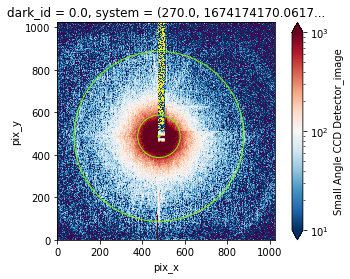

In [25]:
SAXSinteg.mask = drawSAXS.mask

SAXSinteg.ni_beamcenter_x =477.84
SAXSinteg.ni_beamcenter_y = 487.18

phs.IntegrationUtils.Check.checkAll(SAXSinteg,imgSAXS,img_min=10,img_max=1000,d_inner=100,d_outer=400) # Play with min and max so that you can visually align
# Note that this is not a great choice of image in reality

### Beam centers I have used above were determined visually by myself. Do not trust them.

# Integrate the stacks (the long step)

In [60]:
loadedSAXS = load_db.loadRun(c[48820]) # changed over to a non-spiral
WAXS_stack = WAXSinteg.integrateImageStack(loadedWAXS)
SAXS_stack = SAXSinteg.integrateImageStack(loadedSAXS)
# (Noticed that you can't integrate over a spiral stack right now, so will check that out soon)

  0%|          | 0/112 [00:00<?, ?it/s]

  0%|          | 0/112 [00:00<?, ?it/s]

# Load scan - make sure you know what you're getting

In [13]:
def scan_graph_summary(loaded_scan):
    plt.close()
    fig, [ax1, ax2, ax3] = plt.subplots(3,1,figsize=(6,10))
    energies = loaded_scan['en_energy'].values
    pols = loaded_scan['en_polarization'].values
    angles = loaded_scan.sam_th
    time = loaded_scan['time'].values
    time = time - time[0]
    ax1.plot(time,energies,'-o',linewidth=3)
    ax2.plot(time, pols, '-o',linewidth=3,color='red')
    ax3.plot(time, angles, '-o',linewidth=3,color='green')
    ax1.set_ylabel('Energy (eV)')
    ax2.set_ylabel('Polarization')
    ax3.set_ylabel('Incident Angle')
    plt.suptitle(f'Scan {loaded_scan.sampleid}, Sample {loaded_scan.sample_name}')
    plt.show()

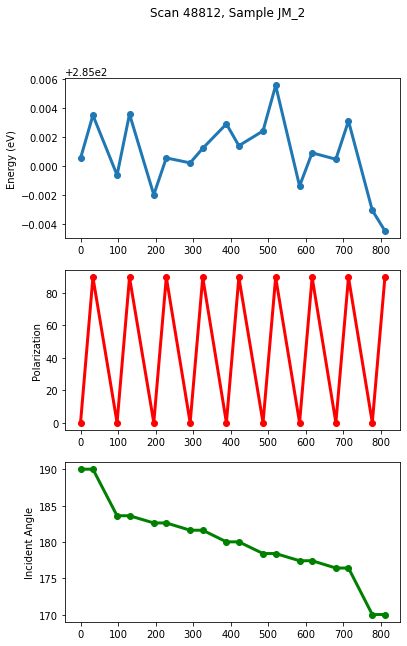

In [14]:
varPth = load_db.loadRun(c[48812])
scan_graph_summary(varPth)

# Case #1: Variable Energy, variable polarization
### Steps to take:
1. Split scan DataArray (DA) into DAs with single polarizations
2. Use DAs with perpendicular polarizations
3. Find: Ivsq, Ipara/perp vs q, A vs q, (A vs E)

### Function to split a scan into single-polarization arrays

In [15]:
def split_arrays(scan_array,final_sort='en_energy'): # final organization of the array; will usually be energy
    split_stack = scan_array.sortby('en_polarization')
    exp_pols = split_stack['en_polarization'].data
    temp_pol = 0.; delP = 0
    pols = np.empty(0); temp_avg = np.empty(0)
    tolerance = 1.

    for i in range(0,np.size(exp_pols)):
        pol1 = exp_pols[i]
        if i != 0:
            delP = pol1 - temp_pol
        if delP <= tolerance:
            temp_avg = np.append(temp_avg,pol1)
        elif delP > tolerance:
            pols = np.append(pols,np.round(np.mean(temp_avg),0))
            temp_avg = np.empty(0)
        if i == (np.size(exp_pols) - 1):
            pols = np.append(pols,np.round(np.mean(temp_avg),0))
        temp_pol = pol1
    numpols = len(pols)
    increment = int(np.size(exp_pols)/numpols)
    splitDAs = []
    start = 0
    for i in range(0,numpols):
        DA_new = split_stack.isel(system=slice(start,start+increment))
        DA_new = DA_new.sortby(final_sort)
        start += increment
        splitDAs.append(DA_new)
    return splitDAs, numpols

# Functions to turn split arrays into I, Ipara/perp, and A vs. q

In [16]:
def Ivsq(stack0,stack90,savetxt=False,savepng=False,outputfolder='',Edivide=1):
    plt.close()
    fig, ax = plt.subplots(figsize=(8,5))
    plot_color = iter(cm.rainbow(np.linspace(0, 1,int(np.size(stack0['system'])/Edivide)+1)))
    for i in range(0,int(np.size(stack0['system']))):
        to_analyze0 = stack0.isel(system=i)
        to_analyze90 = stack90.isel(system=i)
        # first we'll just do the all-space I vs q
        q = to_analyze0['q'].data
        I0 = to_analyze0.mean('chi').data
        I90 = to_analyze90.mean('chi').data
        Itot = I0 + I90
        
        # plot according to how many energies (reduce density)
        if i%Edivide == 0:
            ax.plot(q, Itot, label = f'{to_analyze0.energy[i]}eV',color=next(plot_color))
        if savetxt == True:
            tosave = np.column_stack((q,Itot))
            np.savetxt(f'{outputfolder}{round(to_analyze0.energy[i],2)}eV_Ivsq.txt',tosave)
            
    ax.loglog()
    ax.legend(ncol=3,bbox_to_anchor=(0.5,0.7))
    if savepng == True:
        plt.savefig(f'{outputfolder}Scan{stack0.sampleid}_Ivsq.png')
    
def Iparaperp(stack0,stack90,savetxt=False,outputfolder='',integerplot=25):
    fig, ax = plt.subplots()
    for i in range(0,int(np.size(stack0['system']))):
        to_analyze0 = stack0.isel(system=i)
        to_analyze90 = stack90.isel(system=i)
        para1_0 = to_analyze0.sel(chi=slice(-45,45)).mean('chi').data
        para2_0 = to_analyze0.sel(chi=slice(-180,-135)).mean('chi').data + to_analyze0.sel(chi=slice(135,180)).mean('chi').data
        perp1_0 = to_analyze0.sel(chi=slice(45,135)).mean('chi').data
        perp2_0 = to_analyze0.sel(chi=slice(-135,-45)).mean('chi').data

        para1_90 = to_analyze90.sel(chi=slice(45,135)).mean('chi').data
        para2_90 = to_analyze90.sel(chi=slice(-135,-45)).mean('chi').data
        perp1_90 = to_analyze90.sel(chi=slice(-45,45)).mean('chi').data
        perp2_90 = to_analyze90.sel(chi=slice(-180,-135)).mean('chi').data + to_analyze90.sel(chi=slice(135,180)).mean('chi').data 

        Ipara = para1_0 + para2_0 + para1_90 + para2_90

        Iperp = perp1_0 + perp2_0 + perp1_90 + perp2_90

        q0 = to_analyze0['q'].data
        if i == integerplot:
            ax.plot(q0,Ipara,label='Para')
            ax.plot(q0,Iperp,label='Perp')
            ax.set_title(f'{round(to_analyze0.energy[i],2)}eV')
            paranan_cleanup = Ipara
            q_cleanup = q0
            

        if savetxt==True:
            tosave = np.column_stack((q0,Ipara))
            tosave = np.column_stack((tosave,Iperp))
            np.savetxt(f'{outputfolder}{round(to_analyze0.energy[i],2)}eV_Iparaperpvsq.txt',tosave)
    ax.loglog()
    ax.legend()
    
from scipy.signal import savgol_filter

def Avsq(stack0,stack90,savetxt=False,outputfolder='',Edivide=1):
    fig, ax = plt.subplots()
    for i in range(0,int(np.size(stack0['system']))):
        to_analyze0 = stack0.isel(system=i)
        to_analyze90 = stack90.isel(system=i)
        para1_0 = to_analyze0.sel(chi=slice(-45,45)).mean('chi').data
        para2_0 = to_analyze0.sel(chi=slice(-180,-135)).mean('chi').data + to_analyze0.sel(chi=slice(135,180)).mean('chi').data
        perp1_0 = to_analyze0.sel(chi=slice(45,135)).mean('chi').data
        perp2_0 = to_analyze0.sel(chi=slice(-135,-45)).mean('chi').data

        para1_90 = to_analyze90.sel(chi=slice(45,135)).mean('chi').data
        para2_90 = to_analyze90.sel(chi=slice(-135,-45)).mean('chi').data
        perp1_90 = to_analyze90.sel(chi=slice(-45,45)).mean('chi').data
        perp2_90 = to_analyze90.sel(chi=slice(-180,-135)).mean('chi').data + to_analyze90.sel(chi=slice(135,180)).mean('chi').data 

        Ipara = para1_0 + para2_0 + para1_90 + para2_90

        Iperp = perp1_0 + perp2_0 + perp1_90 + perp2_90
        
        q0 = to_analyze0['q'].data
        
        indexes_para = ~np.isnan(Ipara)
        indexes_perp = ~np.isnan(Iperp)
        if len(Ipara[indexes_para]) > len(Iperp[indexes_perp]):
            q0 = q0[indexes_perp]
            Ipara = Ipara[indexes_perp]
            Iperp = Iperp[indexes_perp]
        elif len(Ipara[indexes_para]) < len(Iperp[indexes_perp]):
            q0 = q0[indexes_para]
            Ipara = Ipara[indexes_para]
            Iperp = Iperp[indexes_para]
            
        parasmooth = savgol_filter(Ipara,polyorder=3,window_length=15)
        perpsmooth = savgol_filter(Iperp,polyorder=3,window_length=15)
        
        A = (parasmooth - perpsmooth)/(parasmooth+perpsmooth)
        
        if i%Edivide == 0:
            ax.plot(q0, A, label = f'{to_analyze0.energy[i]}eV')


        if savetxt==True:
            tosave = np.column_stack((q0,A))
            np.savetxt(f'{outputfolder}{round(to_analyze0.energy[i],2)}eV_Avsq.txt',tosave)
    ax.semilogx()
    ax.set_ylim(-1,1)

### Use for: a scan with energy sweeps at 2 polarizations (48803)

In [17]:
scan_48803_loaded = load_db.loadRun(c[48803])

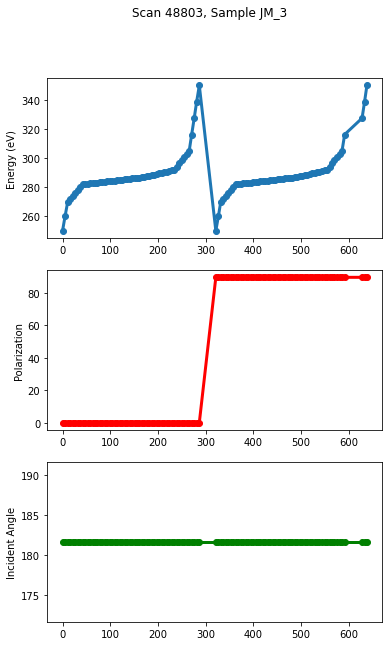

In [18]:
scan_graph_summary(scan_48803_loaded)

In [26]:
integrated_48803 = WAXSinteg.integrateImageStack(scan_48803_loaded)

  0%|          | 0/112 [00:00<?, ?it/s]

In [27]:
split_stacks, numpols = split_arrays(integrated_48803)

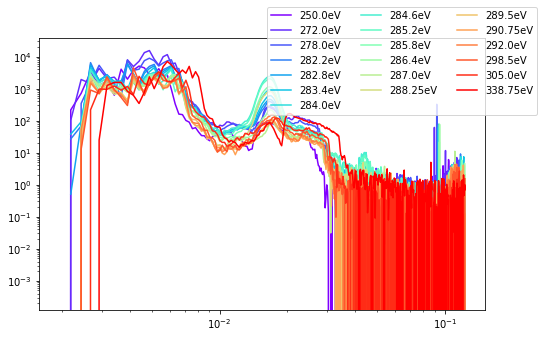

In [29]:
Ivsq(split_stacks[0],split_stacks[1],savepng=True,outputfolder='/nsls2/users/cbishop/Upgrades/today/',Edivide=3) # really would be nice if I put options for separate output folders for png and text

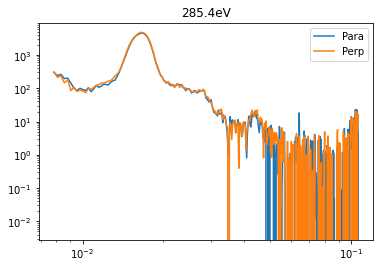

In [30]:
Iparaperp(split_stacks[0],split_stacks[1])

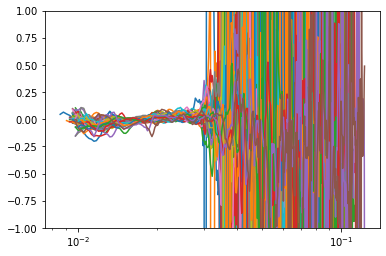

In [31]:
Avsq(split_stacks[0],split_stacks[1])

# Case 2: Variable incident angle, variable polarization
### I am under the impression that people are doing these at a single energy; if anyone does multi-energy, please give me a call at 989-598-4217 if you're not able to add the capability in

### I vs q for a theta series. Should be able to generalize this with the others, but keeping it separate for now

In [42]:
def Ivsq_thseries(stack0,stack90,savetxt=False,outputfolder='',Edivide=1):
    plt.close()
    
    plot_color = iter(cm.rainbow(np.linspace(0, 1,np.size(stack0.sam_th.values))))
    fig, ax = plt.subplots()
    for i in range(0,int(np.size(stack0['system']))):
        to_analyze0 = stack0.isel(system=i)
        to_analyze90 = stack90.isel(system=i)
        # first we'll just do the all-space I vs q
        q = to_analyze0['q'].data
        I0 = to_analyze0.mean('chi').data
        I90 = to_analyze90.mean('chi').data
        Itot = I0 + I90
        
        # plot according to how many energies (reduce density)
        if i%Edivide == 0:
            ax.plot(q, Itot, label = f'{round(stack0.sam_th.values[i],2)}',color=next(plot_color))
        if savetxt == True:
            tosave = np.column_stack((q,Itot))
            np.savetxt(f'{outputfolder}{round(stack0.sam_th.values[i],2)}thin_Ivsq.txt',tosave)
            
    ax.loglog()
    ax.legend(bbox_to_anchor=(1,1))
    ax.set_xlim(0.01,0.1)
    ax.set_ylim(10,10**6)

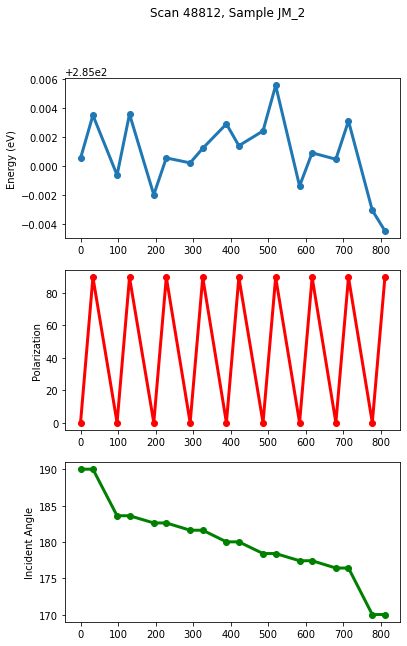

In [52]:
# load scan
varPth = load_db.loadRun(c[48812])
scan_graph_summary(varPth)

### Helpful to slide through the incident theta
Bonus points to someone who can figure out how to print the incident theta on each position. Also below can definitely be generalized; note that the end for the slider must be the number of exposures that you've had.


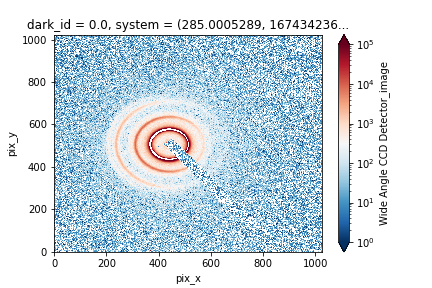

In [47]:
slider_varPth = pnw.IntSlider(name='position', start=0, end=17)
varPth.interactive(width=800).isel(system=slider_varPth).plot(norm=LogNorm(1,1e5))

In [48]:
varPth_int = WAXSinteg.integrateImageStack(varPth)

  0%|          | 0/18 [00:00<?, ?it/s]

In [49]:
split_varPth, numpols = split_arrays(varPth_int,final_sort='sam_th')

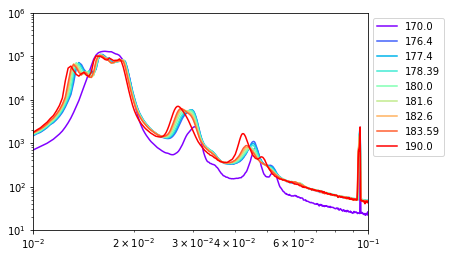

In [51]:
Ivsq_thseries(split_varPth[0],split_varPth[1])

### I para/perp seems not great for this purpose, so let's do I vs chi. Choose q range based upon what you see in the graph above
Do one graph at P=0, one graph at P=90

In [ ]:
    lowq = qbounds[0]; highq = qbounds[1]
    pol_curve45 = unstacked_45.sel(energy=E,method='nearest').sel(q=slice(lowq,highq)).mean('q')
    pol_curve135 = unstacked_135.sel(energy=E,method='nearest').sel(q=slice(lowq,highq)).mean('q')
    chi = np.asarray(pol_curve45['chi']);
    I_45 = np.asarray(pol_curve45); I_135 = np.asarray(pol_curve135)
    bin_center = (lowq+highq)/2 
    normalizer = find_norm(unstacked_45,E,qbin_center=bin_center,bin_width=qbounds[1]-bin_center)
    difference_I = np.subtract(I_45,I_135); difference_I = np.squeeze(difference_I)

In [55]:
qbounds=(0.025,0.035)
thseries0 = split_varPth[0]
to_analyze0 = thseries0.isel(system=2)
chi = to_analyze0['chi'].data
I0 = to_analyze0.sel(q=slice(qbounds[0],qbounds[1])).mean('q').data

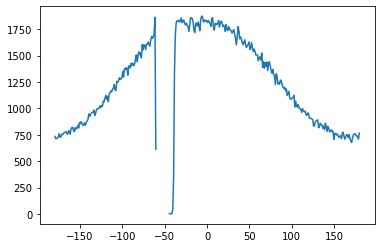

In [57]:
plt.plot(chi,I0)

In [70]:
# a more ideal way to do this would be to track the exact peak position and integrate that
def Ivschi_thseries(stack0,stack90,qbounds=(0.025,0.035),savetxt=False,outputfolder=''):
    plt.close()
    
    plot_color = iter(cm.rainbow(np.linspace(0, 1,np.size(stack0.sam_th.values))))
    fig, [ax1,ax2] = plt.subplots(1,2,figsize=(15,9))
    for i in range(0,int(np.size(stack0['system']))):
        to_analyze0 = stack0.isel(system=i)
        to_analyze90 = stack90.isel(system=i)
        # first we'll just do the all-space I vs q
        chi = to_analyze0['chi'].data
        I0 = to_analyze0.sel(q=slice(qbounds[0],qbounds[1])).mean('q').data
        I90 = to_analyze90.sel(q=slice(qbounds[0],qbounds[1])).mean('q').data                             
                                     

        
        # plot according to how many energies (reduce density)
        to_plot = next(plot_color)
        ax1.plot(chi, I0, label = f'{round(stack0.sam_th.values[i],2)}',color=to_plot)
        ax2.plot(chi, I90, label = f'{round(stack0.sam_th.values[i],2)}',color=to_plot)
                              
        if savetxt == True:
            tosave = np.column_stack((q,Itot))
            np.savetxt(f'{outputfolder}{round(stack0.sam_th.values[i],2)}thin_Ivsq.txt',tosave)
            
    ax1.legend()

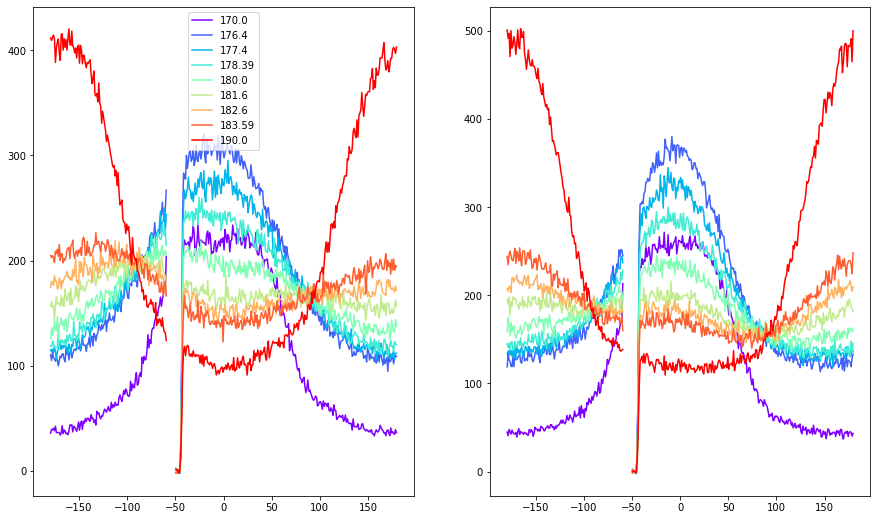

In [72]:
Ivschi_thseries(split_varPth[0],split_varPth[1],qbounds=(0.04,0.06))

In [80]:
def Ivschi_thseries_onegraph(stack0,stack90,qbounds=(0.025,0.035),min_th = 0., max_th = 360.,savetxt=False,outputfolder=''):
    plt.close()
    
    plot_color = iter(cm.rainbow(np.linspace(0, 1,np.size(stack0.sam_th.values))))
    fig, ax = plt.subplots(figsize=(10,10))
    for i in range(0,int(np.size(stack0['system']))):
        to_analyze0 = stack0.isel(system=i)
        to_analyze90 = stack90.isel(system=i)
        # first we'll just do the all-space I vs q
        chi = to_analyze0['chi'].data
        I0 = to_analyze0.sel(q=slice(qbounds[0],qbounds[1])).mean('q').data
        I90 = to_analyze90.sel(q=slice(qbounds[0],qbounds[1])).mean('q').data                             
                                     

        
        # plot according to how many energies (reduce density)
        if (stack0.sam_th.values[i] > min_th) and (stack0.sam_th.values[i] < max_th): # this functionality will let you look at less angles
            to_plot = next(plot_color)
            ax.plot(chi, I0, label = f'{round(stack0.sam_th.values[i],2)}',color=to_plot)
            ax.plot(chi, I90, 'o', label = f'{round(stack0.sam_th.values[i],2)}',color=to_plot)
                              
        if savetxt == True:
            tosave = np.column_stack((q,Itot))
            np.savetxt(f'{outputfolder}{round(stack0.sam_th.values[i],2)}thin_Ivsq.txt',tosave)
            
    ax.legend()

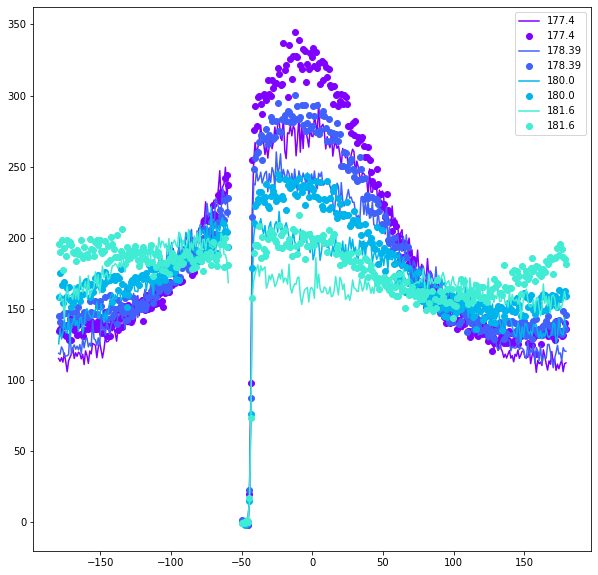

In [81]:
Ivschi_thseries_onegraph(split_varPth[0],split_varPth[1],qbounds=(0.04,0.06))

# Case 3: Single Energy, Rotating Polarization

In [82]:
rotpol = load_db.loadRun(c[48813])

/nsls2/users/cbishop/PyHyperScattering/src/PyHyperScattering/SST1RSoXSDB.py:434: UserWarning: Error while time-integrating onto images.  Check data.
  monitors = self.loadMonitors(run)
/tmp/ipykernel_195064/3382765485.py:1: UserWarning: Error assigning monitor readings to system.  Problem with monitors.  Please check.
  rotpol = load_db.loadRun(c[48813])


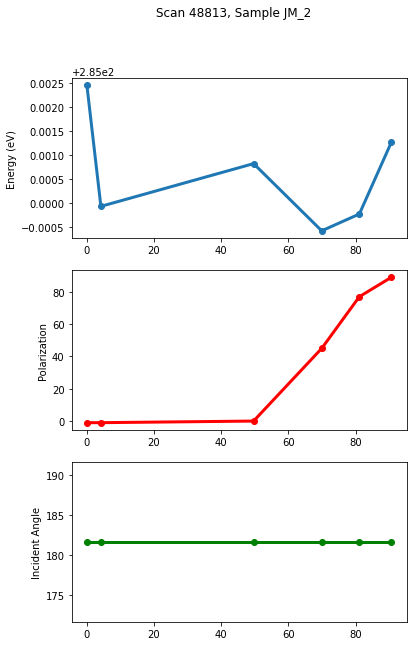

  0%|          | 0/6 [00:00<?, ?it/s]

In [84]:
scan_graph_summary(rotpol)
rotpol_int = WAXSinteg.integrateImageStack(rotpol)

In [107]:
# here, we don't need to split the stacks; we want all the polarizations in there
def Ivschi_polseries(stack,qbounds=(0.025,0.035),savetxt=False,outputfolder=''):
    plt.close()
    
    plot_color = iter(cm.rainbow(np.linspace(0, 1,np.size(stack.en_polarization.values))))
    fig, ax = plt.subplots(figsize=(10,10))
    for i in range(0,int(np.size(stack['system']))):
        to_analyze = stack.isel(system=i)
        # first we'll just do the all-space I vs q
        chi = to_analyze['chi'].data
        I = to_analyze.sel(q=slice(qbounds[0],qbounds[1])).mean('q').data                           
                                     
        # plot according to how many energies (reduce density)
        ax.plot(chi, I, label = f'{round(stack.en_polarization.values[i],2)}',color=next(plot_color))
                              
        if savetxt == True:
            tosave = np.column_stack((q,Itot))
            np.savetxt(f'{outputfolder}{round(stack0.sam_th.values[i],2)}thin_Ivsq.txt',tosave)
            
    ax.legend()

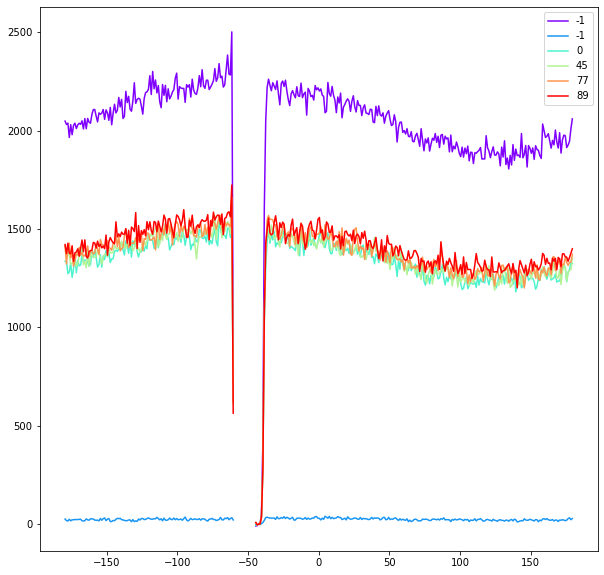

In [108]:
Ivschi_polseries(rotpol_int)


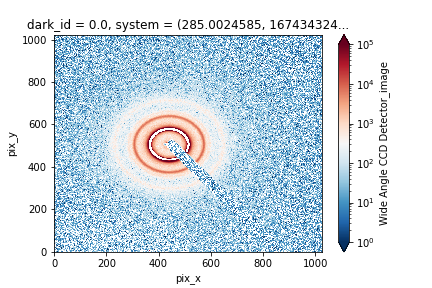

In [97]:
slider_rotpol = pnw.IntSlider(name='position', start=0, end=5)
rotpol.interactive(width=800).isel(system=slider_rotpol).plot(norm=LogNorm(1,1e5))

# Case 4: Old scans taken at separate polarizations (testing backwards compatibility)
### In this case, we need to load 2 scans, and just put them into the Ivsq, Iparaperp vs q, Avsq functions. Note that the scan_graph_summary doesn't work for these right now, but it will be a pretty quick fix (not prioritizing, because 

In [32]:
# 33094 and 33095
oldMG_0 = load_db.loadRun(c[33094])
oldMG_90 = load_db.loadRun(c[33095])
# normal to throw errors about RSoXS Sample Up-Down, don't worry
# scan_graph_summary doesn't work yet, will fix, just not an issue for this run which is where it's most important

/nsls2/users/cbishop/PyHyperScattering/src/PyHyperScattering/SST1RSoXSDB.py:433: UserWarning: While loading RSoXS Sample Up-Down to infill metadata entry for sam_y, found beginning and end values unequal: <ArrayClient shape=(2,) chunks=((2,),) dtype=float64 dims=('time',)>.  It is possible something is messed up.
  md = self.loadMd(run)
/nsls2/users/cbishop/PyHyperScattering/src/PyHyperScattering/SST1RSoXSDB.py:433: UserWarning: While loading RSoXS Sample Outboard-Inboard to infill metadata entry for sam_x, found beginning and end values unequal: <ArrayClient shape=(2,) chunks=((2,),) dtype=float64 dims=('time',)>.  It is possible something is messed up.
  md = self.loadMd(run)


In [37]:
oldMG_0int = WAXSinteg.integrateImageStack(oldMG_0)
oldMG_90int = WAXSinteg.integrateImageStack(oldMG_90)

  0%|          | 0/129 [00:00<?, ?it/s]

  0%|          | 0/129 [00:00<?, ?it/s]

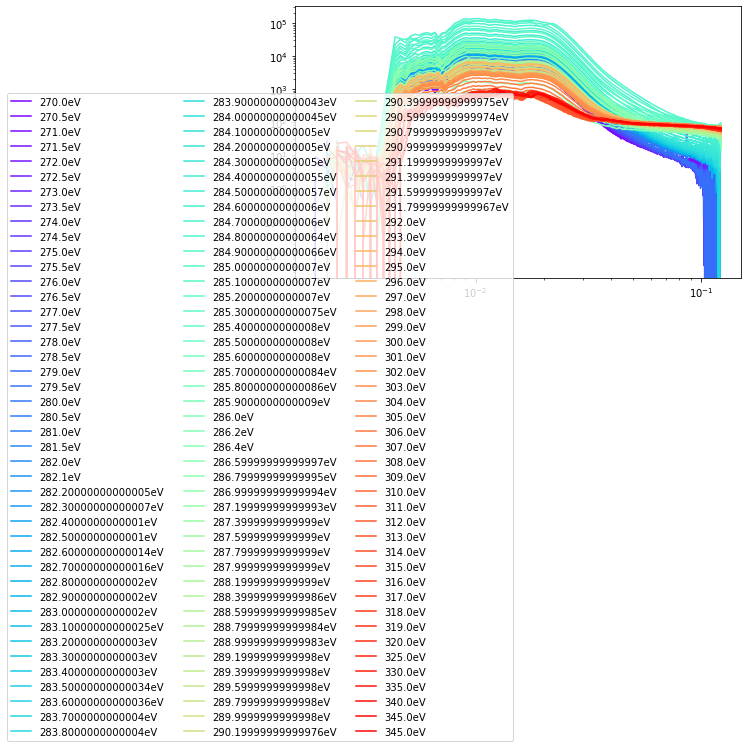

In [38]:
Ivsq(oldMG_0int,oldMG_90int)

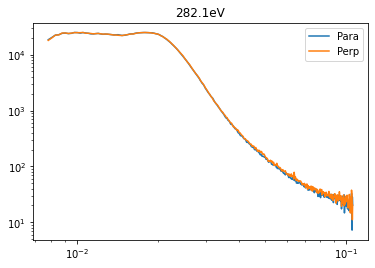

In [40]:
Iparaperp(oldMG_0int,oldMG_90int)

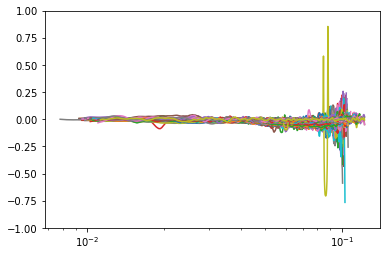

In [41]:
Avsq(oldMG_0int,oldMG_90int)